In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline 

In [2]:
stops = pd.read_csv('Data/google_transit/stops.txt', 
                 delimiter = ',' )

In [3]:
stops.head()

,stop_id,stop_code,stop_name,stop_desc,stop_lat,stop_lon,zone_id,stop_url,location_type,parent_station
0,101,NaN,Van Cortlandt Park - 242 St,NaN,40.889248,-73.898583,NaN,NaN,1,NaN
1,101N,NaN,Van Cortlandt Park - 242 St,NaN,40.889248,-73.898583,NaN,NaN,0,101
2,101S,NaN,Van Cortlandt Park - 242 St,NaN,40.889248,-73.898583,NaN,NaN,0,101
3,103,NaN,238 St,NaN,40.884667,-73.900870,NaN,NaN,1,NaN
4,103N,NaN,238 St,NaN,40.884667,-73.900870,NaN,NaN,0,103


In [21]:
len(stops['stop_id'].unique())

1503

There are 380 unique stops in the "stops.txt" dataset.

In [5]:
trips = pd.read_csv('Data/google_transit/trips.txt',
              delimiter = ',')

trips.head(10)

,route_id,service_id,trip_id,trip_headsign,direction_id,block_id,shape_id
0,7,A20170625SUN,A20170625SUN_001150_7..S97R,34 ST - 11 AV,1,NaN,7..S97R
1,7,A20170625SUN,A20170625SUN_006150_7..N97R,FLUSHING - MAIN ST,0,NaN,7..N97R
2,7,A20170625SUN,A20170625SUN_012000_7..S97R,34 ST - 11 AV,1,NaN,7..S97R
3,7,A20170625SUN,A20170625SUN_017650_7..N97R,FLUSHING - MAIN ST,0,NaN,7..N97R
4,7,A20170625SUN,A20170625SUN_024000_7..S97R,34 ST - 11 AV,1,NaN,7..S97R
5,7,A20170625SUN,A20170625SUN_029650_7..N97R,FLUSHING - MAIN ST,0,NaN,7..N97R
6,7,A20170625SUN,A20170625SUN_035000_7..S97R,34 ST - 11 AV,1,NaN,7..S97R
7,7,A20170625SUN,A20170625SUN_039800_7..N97R,FLUSHING - MAIN ST,0,NaN,7..N97R
8,7,A20170625SUN,A20170625SUN_044100_7..S97R,34 ST - 11 AV,1,NaN,7..S97R
9,7,A20170625SUN,A20170625SUN_049050_7..N97R,FLUSHING - MAIN ST,0,NaN,7..N97R


In [6]:
stop_times = pd.read_csv('Data/google_transit/stop_times.txt',
                        delimiter = ',')

stop_times.head(10)


,trip_id,arrival_time,departure_time,stop_id,stop_sequence,stop_headsign,pickup_type,drop_off_type,shape_dist_traveled
0,A20170625SUN_001150_7..S97R,00:11:30,00:11:30,701S,1,NaN,0,0,NaN
1,A20170625SUN_001150_7..S97R,00:14:00,00:14:00,702S,2,NaN,0,0,NaN
2,A20170625SUN_001150_7..S97R,00:15:30,00:15:30,705S,3,NaN,0,0,NaN
3,A20170625SUN_001150_7..S97R,00:16:30,00:16:30,706S,4,NaN,0,0,NaN
4,A20170625SUN_001150_7..S97R,00:17:30,00:17:30,707S,5,NaN,0,0,NaN
5,A20170625SUN_001150_7..S97R,00:19:00,00:19:00,708S,6,NaN,0,0,NaN
6,A20170625SUN_001150_7..S97R,00:20:00,00:20:00,709S,7,NaN,0,0,NaN
7,A20170625SUN_001150_7..S97R,00:21:00,00:21:00,710S,8,NaN,0,0,NaN
8,A20170625SUN_001150_7..S97R,00:22:30,00:22:30,711S,9,NaN,0,0,NaN
9,A20170625SUN_001150_7..S97R,00:24:30,00:24:30,712S,10,NaN,0,0,NaN


In [8]:
len(stop_times.stop_id.unique())

987

<h1> To Do </h1>

* Merge Stops and Stop Times
* Create a summary dataset that shows the time 
* Show distribution of this merged, summarized dataset.

<h4> Ambition </h4>

* Try to get a map visualization using the locations

<h4> Try to get a summary table of the stop_times to get a sense of the distribution of stops. </h4>

In [39]:
stop_times_aggregated = (stop_times.
                         groupby(['stop_id'],
                                 as_index= 'False').
                                 count().
                                 reset_index())

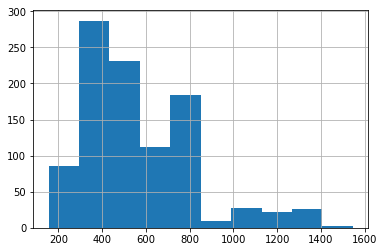

In [19]:
stop_times_aggregated['trip_id'].hist()

In [22]:
len(stop_times_aggregated)

987

In [42]:
stop_times_aggregated['total_trips'] = stop_times_aggregated['trip_id']

In [50]:
total_trips = stop_times_aggregated.loc[:,['stop_id','total_trips']]

In [51]:
total_trips.head()

,stop_id,total_trips
0,101N,513
1,101S,499
2,103N,513
3,103S,516
4,104N,513


<h4> How to merge two datasets with the same "keys" (unique identifiers) </h4>



In [52]:
merged_stop_data = stops.merge(total_trips, on = 'stop_id', how = 'left')

In [53]:
merged_stop_data.sample(20)

,stop_id,stop_code,stop_name,stop_desc,stop_lat,stop_lon,zone_id,stop_url,location_type,parent_station,total_trips
448,635N,NaN,14 St - Union Sq,NaN,40.734673,-73.989951,NaN,NaN,0,635,1374.0
620,A36S,NaN,Chambers St,NaN,40.714111,-74.008585,NaN,NaN,0,A36,701.0
844,D38N,NaN,Neck Rd,NaN,40.595246,-73.955161,NaN,NaN,0,D38,426.0
163,218N,NaN,Intervale Av,NaN,40.822181,-73.896736,NaN,NaN,0,218,733.0
41,116S,NaN,125 St,NaN,40.815581,-73.958372,NaN,NaN,0,116,522.0
954,F38,NaN,Avenue X,NaN,40.589620,-73.974250,NaN,NaN,1,NaN,NaN
1076,H12S,NaN,Beach 90 St,NaN,40.588034,-73.813641,NaN,NaN,0,H12,245.0
1071,H11,NaN,Far Rockaway - Mott Av,NaN,40.603995,-73.755405,NaN,NaN,1,NaN,NaN
172,221N,NaN,3 Av - 149 St,NaN,40.816109,-73.917757,NaN,NaN,0,221,778.0
872,F03S,NaN,Parsons Blvd,NaN,40.707564,-73.803326,NaN,NaN,0,F03,429.0


In [4]:
def get_my_string(inputFn):
    """Returns the file inputFn"""

    try:
        with open(inputFn) as inputFileHandle:
            return inputFileHandle.read()

    except IOError:
        sys.stderr.write( "[myScript] - Error: Could not open %s\n" % (inputFn) )
        sys.exit(-1)

In [2]:
subways = pd.read_csv('/Users/jonathanjramirez/Downloads/DOITT_SUBWAY_STATION_01_13SEPT2010.csv')

In [3]:
subways.head(10)

,URL,OBJECTID,NAME,the_geom,LINE,NOTES
0,http://web.mta.info/nyct/service/,1,Astor Pl,POINT (-73.99106999861966 40.73005400028978),4-6-6 Express,"4 nights, 6-all times, 6 Express-weekdays AM s..."
1,http://web.mta.info/nyct/service/,2,Canal St,POINT (-74.00019299927328 40.71880300107709),4-6-6 Express,"4 nights, 6-all times, 6 Express-weekdays AM s..."
2,http://web.mta.info/nyct/service/,3,50th St,POINT (-73.98384899986625 40.76172799961419),1-2,"1-all times, 2-nights"
3,http://web.mta.info/nyct/service/,4,Bergen St,POINT (-73.97499915116808 40.68086213682956),2-3-4,"4-nights, 3-all other times, 2-all times"
4,http://web.mta.info/nyct/service/,5,Pennsylvania Ave,POINT (-73.89488591154061 40.66471445143568),3-4,"4-nights, 3-all other times"
5,http://web.mta.info/nyct/service/,6,238th St,POINT (-73.90087000018522 40.88466700064975),1,"1-all times, exit only northbound"
6,http://web.mta.info/nyct/service/,7,Cathedral Pkwy (110th St),POINT (-73.95806670661364 40.800581558114956),A-B-C,"A-nights, B-weekdays and evenings, C-all times..."
7,http://web.mta.info/nyct/service/,8,Kingston - Throop Aves,POINT (-73.94085899871263 40.67991899941601),A-C,"A-nights, C-all other times"
8,http://web.mta.info/nyct/service/,9,65th St,POINT (-73.8987883783301 40.74971952935675),E-M-R,"E-nights, R-all other times, M-weekdays and ev..."
9,http://web.mta.info/nyct/service/,10,36th St,POINT (-73.92901818461539 40.75196004401078),E-M-R,"E-nights, R-all other times, M-weekdays and ev..."


In [11]:
import csv

counter = 0

with open("/Users/jonathanjramirez/Downloads/US/US.txt") as tsv:

    
    while counter < 10:
        for line in csv.reader(tsv, dialect="excel-tab"):
            print(line)
            counter += 1

['2130833', 'McArthur Reef', 'McArthur Reef', '', '52.06667', '177.86667', 'U', 'RFU', 'US', '', 'AK', '016', '', '', '0', '', '-9999', 'Asia/Kamchatka', '2016-07-05']
['3831610', 'Little Stellwagen Basin', 'Little Stellwagen Basin', '', '42.11667', '-70.28333', 'U', 'BSNU', 'US', '', '00', '', '', '', '0', '', '-9999', 'America/New_York', '2017-05-26']
['3981608', 'Tia Juana River', 'Tia Juana River', 'Rio Tiajuana,Rio Tijuana,Río Tijuana,Tia Juana River', '32.55668', '-117.12865', 'H', 'STM', 'US', '', '', '', '', '', '0', '', '4', 'America/Los_Angeles', '2011-10-20']
['4020151', 'Southern California Borderland', 'Southern California Borderland', '', '32.5', '-118.5', 'U', 'BDLU', 'US', '', 'CA', '', '', '', '0', '', '-9999', 'America/Cambridge_Bay', '2016-02-08']
['4020248', 'Monterey Canyon', 'Monterey Canyon', "Kan'on Monterej,Kan'on Monterey,Kan’on Monterey,Monterey Deep-Sea Channel,Monterey Gorge,Monterey Seavalley,Monterey Submarine Canyon,Monterey Trough,Каньон Монтерей", '36.

['4047085', 'Beech Spring Church', 'Beech Spring Church', 'Bean Rock Church,Beech Spring Church', '34.45287', '-86.46443', 'S', 'CH', 'US', '', 'AL', '095', '', '', '0', '184', '195', 'America/Chicago', '2006-01-15']
['4047086', 'Meadows', 'Meadows', '', '38.91511', '-79.74256', 'P', 'PPL', 'US', '', 'WV', '083', '', '', '0', '671', '667', 'America/New_York', '2006-01-15']
['4047087', 'Beech Spring Hollow', 'Beech Spring Hollow', '', '34.64815', '-87.71031', 'T', 'VAL', 'US', '', 'AL', '033', '', '', '0', '143', '143', 'America/Chicago', '2010-02-14']
['4047088', 'Middletown', 'Middletown', 'Middleton,Middletown', '39.44203', '-80.25536', 'S', '', 'US', '', 'WV', '049', '', '', '0', '296', '288', 'America/New_York', '2010-02-18']
['4047089', 'Beech Spring', 'Beech Spring', '', '34.64103', '-87.70269', 'H', 'SPNG', 'US', '', 'AL', '033', '', '', '0', '218', '235', 'America/Chicago', '2011-12-11']
['4047090', 'Mountain Home', 'Mountain Home', 'Mount Home,Mountain Home', '38.52232', '-81.

['4049109', 'Beulah Church', 'Beulah Church', '', '33.44122', '-86.47832', 'S', 'CH', 'US', '', 'AL', '117', '', '', '0', '162', '163', 'America/Chicago', '2006-01-15']
['4049110', 'Whitehurst', 'Whitehurst', '', '39.08261', '-76.52663', 'P', 'PPL', 'US', '', 'MD', '003', '', '', '0', '6', '8', 'America/New_York', '2006-01-15']
['4049111', 'Beulah Church', 'Beulah Church', '', '33.68677', '-86.47304', 'S', 'CH', 'US', '', 'AL', '115', '', '', '0', '199', '202', 'America/Chicago', '2010-02-14']
['4049112', 'Westside Shopping Center', 'Westside Shopping Center', '', '39.28261', '-76.6558', 'S', 'MALL', 'US', '', 'MD', '510', '', '', '0', '25', '30', 'America/New_York', '2006-01-15']
['4049113', 'Beulah Baptist Church', 'Beulah Baptist Church', 'Beulah Baptist Church,Beulah Church', '32.32986', '-88.3117', 'S', 'CH', 'US', '', 'AL', '119', '', '', '0', '80', '82', 'America/Chicago', '2007-02-14']
['4049114', 'White Hall', 'White Hall', '', '39.58761', '-75.83827', 'P', 'PPL', 'US', '', 'M

['4051529', 'Brady Branch', 'Brady Branch', '', '31.33572', '-88.05473', 'H', 'STM', 'US', '', 'AL', '129', '', '', '0', '8', '8', 'America/Chicago', '2010-09-05']
['4051530', 'Bradleys Pond', 'Bradleys Pond', '', '32.31703', '-85.0463', 'H', 'RSV', 'US', '', 'AL', '113', '', '', '0', '93', '108', 'America/Chicago', '2011-12-11']
['4051531', 'Brady Lake Dam', 'Brady Lake Dam', '', '33.45678', '-85.53496', 'S', 'DAM', 'US', '', 'AL', '111', '', '', '0', '322', '337', 'America/Chicago', '2010-02-14']
['4051532', 'Braehead (historical)', 'Braehead (historical)', '', '33.0829', '-87.15361', 'P', 'PPLQ', 'US', '', 'AL', '007', '', '', '0', '134', '144', 'America/Chicago', '2011-12-11']
['4051533', 'Braehead Slope Mine', 'Braehead Slope Mine', '', '33.06845', '-87.17222', 'S', 'MN', 'US', '', 'AL', '007', '', '', '0', '138', '147', 'America/Chicago', '2006-01-15']
['4051534', 'Bragg Cemetery', 'Bragg Cemetery', '', '31.89932', '-86.78415', 'S', 'CMTY', 'US', '', 'AL', '013', '', '', '0', '13

['4053828', 'Carrollton Methodist Church', 'Carrollton Methodist Church', '', '33.26262', '-88.09336', 'S', 'CH', 'US', '', 'AL', '107', '', '', '0', '71', '75', 'America/Chicago', '2010-02-14']
['4053829', 'Carrollton Post Office', 'Carrollton Post Office', '', '33.26206', '-88.09558', 'S', 'PO', 'US', '', 'AL', '107', '', '', '0', '75', '76', 'America/Chicago', '2006-01-15']
['4053830', 'Carrols Lake', 'Carrols Lake', '', '33.63338', '-86.05795', 'H', 'RSV', 'US', '', 'AL', '121', '', '', '0', '174', '167', 'America/Chicago', '2011-12-11']
['4053831', 'Physicians Carraway Medical Center', 'Physicians Carraway Medical Center', 'Carroway Methodist Hospital,Carroway Methodist Medical Center,Physicians Carraway Medical Center', '33.53688', '-86.81074', 'S', 'HSP', 'US', '', 'AL', '073', '', '', '0', '194', '208', 'America/Chicago', '2011-12-11']
['4053832', 'Carrs Chapel', 'Carrs Chapel', 'Carrs Chapel,Carrs Chapel Church,Carrs Church', '31.8921', '-85.86939', 'S', 'CH', 'US', '', 'AL', 

['4056134', 'Coffee Springs Elementary School', 'Coffee Springs Elementary School', '', '31.17073', '-85.9091', 'S', 'SCH', 'US', '', 'AL', '061', '', '', '0', '79', '81', 'America/Chicago', '2006-01-15']
['4056135', 'Coffman Branch', 'Coffman Branch', '', '34.89453', '-87.04195', 'H', 'STM', 'US', '', 'AL', '083', '', '', '0', '171', '182', 'America/Chicago', '2006-01-15']
['4056136', 'Cofield Bend', 'Cofield Bend', '', '34.2626', '-87.70919', 'H', 'STMB', 'US', '', 'AL', '093', '', '', '0', '238', '240', 'America/Chicago', '2010-02-14']
['4056137', 'Cogswell Avenue Industrial Park', 'Cogswell Avenue Industrial Park', '', '33.59316', '-86.23887', 'L', 'INDS', 'US', '', 'AL', '115', '', '', '0', '148', '145', 'America/Chicago', '2010-02-14']
['4056138', 'Cohabie Creek', 'Cohabie Creek', 'Cohabie Creek,Penniwinkle Branch,Penniwinkle Creek', '33.15817', '-86.41498', 'H', 'STM', 'US', '', 'AL', '121', '', '', '0', '123', '132', 'America/Chicago', '2006-01-15']
['4056139', 'Coger Hill Chur

['4058545', 'Deatsville Elementary School (historical)', 'Deatsville Elementary School (historical)', '', '32.60985', '-86.38747', 'S', 'SCH', 'US', '', 'AL', '051', '', '', '0', '106', '117', 'America/Chicago', '2006-01-15']
['4058546', 'Deatsville Post Office', 'Deatsville Post Office', 'Deatsville Post Office,Deetsville Post Office', '32.60836', '-86.3963', 'S', 'PO', 'US', '', 'AL', '051', '', '', '0', '95', '96', 'America/Chicago', '2016-12-06']
['4058547', 'Deavers Branch', 'Deavers Branch', '', '33.91065', '-86.59805', 'H', 'STM', 'US', '', 'AL', '009', '', '', '0', '137', '143', 'America/Chicago', '2006-01-15']
['4058548', 'Deason Hill', 'Deason Hill', '', '33.74789', '-87.225', 'P', 'PPL', 'US', '', 'AL', '127', '', '', '0', '143', '142', 'America/Chicago', '2006-01-15']
['4058549', 'Deavers Town', 'Deavers Town', '', '33.92315', '-86.58749', 'P', 'PPL', 'US', '', 'AL', '009', '', '', '0', '145', '147', 'America/Chicago', '2006-01-15']
['4058550', 'Debardeleben', 'Debardeleben

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


['4077425', 'Mount Calvary Church', 'Mount Calvary Church', '', '33.68093', '-86.2822', 'S', 'CH', 'US', '', 'AL', '115', '', '', '0', '166', '177', 'America/Chicago', '2010-02-14']
['4077426', 'Mount Calvary Baptist Church', 'Mount Calvary Baptist Church', 'Mount Calvary Baptist Church,Mount Calvary Church', '33.43233', '-85.99775', 'S', 'CH', 'US', '', 'AL', '121', '', '', '0', '213', '217', 'America/Chicago', '2010-02-14']
['4077427', 'Mount Calvary Baptist Church', 'Mount Calvary Baptist Church', 'Mount Calvary Baptist Church,Mount Calvary Church', '32.88846', '-85.96608', 'S', 'CH', 'US', '', 'AL', '123', '', '', '0', '178', '182', 'America/Chicago', '2007-02-14']
['4077428', 'Mount Calvary Church (historical)', 'Mount Calvary Church (historical)', '', '32.86735', '-88.32392', 'S', 'CH', 'US', '', 'AL', '119', '', '', '0', '57', '58', 'America/Chicago', '2010-02-14']
['4077429', 'Mount Calvary Lutheran Church', 'Mount Calvary Lutheran Church', '', '30.66575', '-88.07833', 'S', 'CH

['4079894', 'New Light Baptist Church', 'New Light Baptist Church', '', '30.75824', '-88.12111', 'S', 'CH', 'US', '', 'AL', '097', '', '', '0', '13', '16', 'America/Chicago', '2006-01-15']
['4079895', 'New Light Cemetery', 'New Light Cemetery', '', '32.92402', '-88.04224', 'S', 'CMTY', 'US', '', 'AL', '063', '', '', '0', '61', '71', 'America/Chicago', '2010-02-14']
['4079896', 'New Light Baptist Church', 'New Light Baptist Church', 'New Light Baptist Church,New Light Church', '32.92318', '-88.0428', 'S', 'CH', 'US', '', 'AL', '063', '', '', '0', '60', '66', 'America/Chicago', '2007-02-14']
['4079897', 'New Light Baptist Church', 'New Light Baptist Church', 'New Light Baptist Church,New Light Church', '31.21545', '-88.33501', 'S', 'CH', 'US', '', 'AL', '129', '', '', '0', '55', '56', 'America/Chicago', '2010-09-05']
['4079898', 'New Light Methodist Church', 'New Light Methodist Church', '', '33.36344', '-86.22886', 'S', 'CH', 'US', '', 'AL', '121', '', '', '0', '139', '134', 'America/Ch

['4082268', 'Partlow Lake Upper', 'Partlow Lake Upper', '', '33.24089', '-87.64025', 'H', 'RSV', 'US', '', 'AL', '125', '', '', '0', '50', '60', 'America/Chicago', '2011-12-11']
['4082269', 'William D Partlow Developmental Center (historical)', 'William D Partlow Developmental Center (historical)', 'Alabama Home For Mental Defectives,Partlow State School For Deficients,Partlow State School and Hospital,William D Partlow Developmental Center (historical)', '33.2102', '-87.51593', 'S', 'HSP', 'US', '', 'AL', '125', '', '', '0', '92', '95', 'America/Chicago', '2012-04-09']
['4082270', 'Parton Branch', 'Parton Branch', '', '34.74369', '-85.83081', 'H', 'STM', 'US', '', 'AL', '071', '', '', '0', '181', '180', 'America/Chicago', '2006-01-15']
['4082271', 'Parsons', 'Parsons', '', '33.62788', '-86.50026', 'P', 'PPL', 'US', '', 'AL', '115', '', '', '0', '197', '206', 'America/Chicago', '2010-02-14']
['4082272', 'Partridge Creek', 'Partridge Creek', 'McGehee Creek,Partridge Creek', '33.1129', '

['4084725', 'Powells Ferry (historical)', 'Powells Ferry (historical)', '', '32.35347', '-86.68331', 'R', 'RDJCT', 'US', '', 'AL', '085', '', '', '0', '38', '40', 'America/Chicago', '2010-02-14']
['4084726', 'Powells Landing (historical)', 'Powells Landing (historical)', '', '31.47322', '-87.9175', 'S', '', 'US', '', 'AL', '129', '', '', '0', '3', '13', 'America/Chicago', '2010-02-14']
['4084727', 'Powellton (historical)', 'Powellton (historical)', '', '32.73957', '-86.10524', 'S', '', 'US', '', 'AL', '051', '', '', '0', '224', '238', 'America/Chicago', '2010-02-14']
['4084728', 'Powellville', 'Powellville', '', '33.90844', '-87.09945', 'P', 'PPL', 'US', '', 'AL', '127', '', '', '0', '177', '178', 'America/Chicago', '2006-01-15']
['4084729', 'Powers', 'Powers', '', '32.96568', '-87.65584', 'P', 'PPL', 'US', '', 'AL', '065', '', '', '0', '46', '45', 'America/Chicago', '2006-01-15']
['4084730', 'Powers Cemetery', 'Powers Cemetery', '', '34.86092', '-86.75833', 'S', 'CMTY', 'US', '', 'AL'

['4087050', 'Rosemont', 'Rosemont', '', '33.45789', '-86.88499', 'P', 'PPL', 'US', '', 'AL', '073', '', '', '0', '171', '172', 'America/Chicago', '2006-01-15']
['4087051', 'Rosemont Heights', 'Rosemont Heights', '', '32.40125', '-86.26302', 'P', 'PPLX', 'US', '', 'AL', '101', '', '', '0', '68', '71', 'America/Chicago', '2007-02-14']
['4087052', 'Rosemount Cemetery', 'Rosemount Cemetery', '', '32.45569', '-87.51528', 'S', 'CMTY', 'US', '', 'AL', '105', '', '', '0', '87', '91', 'America/Chicago', '2006-01-15']
['4087053', 'Rosenwald School', 'Rosenwald School', '', '32.79985', '-87.78029', 'S', 'SCH', 'US', '', 'AL', '065', '', '', '0', '40', '44', 'America/Chicago', '2010-02-14']
['4087054', 'Rosenwald School (historical)', 'Rosenwald School (historical)', '', '32.45514', '-86.0608', 'S', 'SCH', 'US', '', 'AL', '051', '', '', '0', '125', '127', 'America/Chicago', '2006-01-15']
['4087055', 'Rosenwald School (historical)', 'Rosenwald School (historical)', '', '33.03957', '-87.91057', 'S',

['4089486', 'Sharps Ford Bridge', 'Sharps Ford Bridge', '', '34.54343', '-86.72666', 'S', 'BDG', 'US', '', 'AL', '103', '', '', '0', '170', '171', 'America/Chicago', '2006-01-15']
['4089487', 'Sharps Hollow', 'Sharps Hollow', '', '34.92703', '-87.9817', 'T', 'VAL', 'US', '', 'AL', '077', '', '', '0', '146', '155', 'America/Chicago', '2006-01-15']
['4089488', 'Sharp Pond', 'Sharp Pond', '', '34.51226', '-86.74732', 'H', 'LK', 'US', '', 'AL', '103', '', '', '0', '177', '177', 'America/Chicago', '2011-12-11']
['4089489', 'Sharps Mill Pond', 'Sharps Mill Pond', 'Sharps Mill Pond,Whites Lake,Whites Mill Lake', '34.90842', '-87.70503', 'H', 'RSV', 'US', '', 'AL', '077', '', '', '0', '162', '169', 'America/Chicago', '2006-01-15']
['4089490', 'Sharps Shores', 'Sharps Shores', '', '34.78064', '-87.31113', 'P', 'PPLX', 'US', '', 'AL', '077', '', '', '0', '174', '184', 'America/Chicago', '2010-02-14']
['4089491', 'Shaver Gap', 'Shaver Gap', '', '34.51342', '-86.55999', 'T', 'GAP', 'US', '', 'AL',

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


['4108295', 'Ditch Number 1', 'Ditch Number 1', '', '35.60397', '-90.64317', 'H', 'CNL', 'US', '', 'AR', '111', '', '', '0', '65', '67', 'America/Chicago', '2006-01-15']
['4108296', 'Ditch Number 1', 'Ditch Number 1', '', '35.07537', '-90.4101', 'H', 'CNL', 'US', '', 'AR', '123', '', '', '0', '60', '61', 'America/Chicago', '2010-09-05']
['4108297', 'Ditch Number 1', 'Ditch Number 1', '', '34.9762', '-91.32096', 'H', 'CNL', 'US', '', 'AR', '147', '', '', '0', '53', '57', 'America/Chicago', '2006-01-15']
['4108298', 'Ditch Number 10', 'Ditch Number 10', '', '36.32478', '-90.43677', 'H', 'CNL', 'US', '', 'AR', '021', '', '', '0', '89', '88', 'America/Chicago', '2010-09-05']
['4108299', 'Ditch Number 10', 'Ditch Number 10', '', '35.81924', '-90.47038', 'H', 'CNL', 'US', '', 'AR', '031', '', '', '0', '69', '69', 'America/Chicago', '2006-01-15']
['4108300', 'Ditch Number 10', 'Ditch Number 10', '', '35.15454', '-90.26399', 'H', 'CNL', 'US', '', 'AR', '035', '', '', '0', '64', '62', 'America/

['4110783', 'First Christian Church', 'First Christian Church', '', '34.49426', '-91.55263', 'S', 'CH', 'US', '', 'AR', '001', '91563', '', '0', '65', '67', 'America/Chicago', '2017-05-23']
['4110784', 'First Christian Church', 'First Christian Church', '', '34.2951', '-91.33845', 'S', 'CH', 'US', '', 'AR', '001', '92085', '', '0', '56', '62', 'America/Chicago', '2017-05-23']
['4110785', 'First Christian Church', 'First Christian Church', '', '36.33396', '-92.37905', 'S', 'CH', 'US', '', 'AR', '005', '92616', '', '0', '245', '250', 'America/Chicago', '2017-05-23']
['4110786', 'First Christian Church', 'First Christian Church', '', '36.32563', '-94.13409', 'S', 'CH', 'US', '', 'AR', '007', '93630', '', '0', '426', '430', 'America/Chicago', '2017-05-23']
['4110787', 'First Christian Church', 'First Christian Church', '', '36.3659', '-93.5638', 'S', 'CH', 'US', '', 'AR', '015', '92982', '', '0', '384', '387', 'America/Chicago', '2017-05-23']
['4110788', 'First Christian Church', 'First Ch

['4113334', 'Gum Flats', 'Gum Flats', '', '33.7229', '-94.30409', 'T', 'PLN', 'US', '', 'AR', '081', '', '', '0', '106', '113', 'America/Chicago', '2010-09-05']
['4113335', 'Gum Hollow', 'Gum Hollow', '', '36.01424', '-92.1746', 'T', 'VAL', 'US', '', 'AR', '137', '', '', '0', '176', '197', 'America/Chicago', '2010-09-05']
['4113336', 'Gum Island', 'Gum Island', '', '35.86896', '-90.44094', 'T', 'ISL', 'US', '', 'AR', '031', '', '', '0', '69', '80', 'America/Chicago', '2006-01-15']
['4113337', 'Gum Log Creek', 'Gum Log Creek', 'Gum Log Creek,Gumlog Creek', '35.28592', '-92.87128', 'H', 'STM', 'US', '', 'AR', '115', '', '', '0', '88', '99', 'America/Chicago', '2010-09-05']
['4113338', 'Gum Log', 'Gum Log', 'Gum Log,Gumlog', '35.33897', '-93.04628', 'S', '', 'US', '', 'AR', '115', '93765', '', '0', '142', '145', 'America/Chicago', '2017-05-23']
['4113339', 'Township of Gum Log', 'Township of Gum Log', 'Gum Log Township,Gumlog Township,Township of Gum Log', '35.28147', '-92.99477', 'A', 'A

['4115454', 'Hout Ditch', 'Hout Ditch', '', '35.73008', '-91.25763', 'H', 'CNL', 'US', '', 'AR', '067', '', '', '0', '73', '74', 'America/Chicago', '2011-01-10']
['4115455', 'Hovel Creek', 'Hovel Creek', '', '34.57371', '-93.57741', 'H', 'STM', 'US', '', 'AR', '097', '', '', '0', '177', '184', 'America/Chicago', '2010-09-05']
['4115456', 'Township of Houston', 'Township of Houston', 'Houston Township', '35.04191', '-92.6918', 'A', 'ADM3', 'US', '', 'AR', '105', '91776', '', '0', '107', '110', 'America/Chicago', '2017-05-14']
['4115457', 'Howard Branch', 'Howard Branch', '', '36.22896', '-91.42791', 'H', 'STM', 'US', '', 'AR', '135', '', '', '0', '110', '123', 'America/Chicago', '2010-09-05']
['4115458', 'Howard', 'Howard', '', '34.70594', '-94.43716', 'P', 'PPL', 'US', '', 'AR', '113', '93162', '', '0', '393', '401', 'America/Chicago', '2017-05-23']
['4115459', 'Howard Cemetery', 'Howard Cemetery', 'Booger Hollow Cemetery,Howard Cemetery', '35.47508', '-93.1474', 'S', 'CMTY', 'US', '',

['4117975', 'Lake Krislor Dam', 'Lake Krislor Dam', '', '34.49676', '-92.72183', 'S', 'DAM', 'US', '', 'AR', '125', '91269', '', '0', '142', '158', 'America/Chicago', '2017-05-23']
['4117976', 'Lake Kuykendall Dam', 'Lake Kuykendall Dam', '', '34.59037', '-92.19181', 'S', 'DAM', 'US', '', 'AR', '119', '90300', '', '0', '69', '71', 'America/Chicago', '2017-05-23']
['4117977', 'Lake Lago', 'Lake Lago', '', '34.67772', '-92.94705', 'H', 'RSV', 'US', '', 'AR', '125', '', '', '0', '194', '206', 'America/Chicago', '2011-12-11']
['4117978', 'Lake Lago Dam', 'Lake Lago Dam', '', '34.68009', '-92.94184', 'S', 'DAM', 'US', '', 'AR', '125', '92370', '', '0', '176', '185', 'America/Chicago', '2017-05-23']
['4117979', 'Lake Lakima', 'Lake Lakima', '', '35.0437', '-94.07333', 'H', 'RSV', 'US', '', 'AR', '083', '', '', '0', '177', '186', 'America/Chicago', '2011-12-11']
['4117980', 'Lake Lakima Dam', 'Lake Lakima Dam', '', '35.04343', '-94.07521', 'S', 'DAM', 'US', '', 'AR', '127', '93620', '', '0', 

['4120367', 'Malcolm Chapel', 'Malcolm Chapel', '', '34.11871', '-91.24428', 'S', 'CH', 'US', '', 'AR', '001', '90774', '', '0', '54', '56', 'America/Chicago', '2017-05-23']
['4120368', 'Malcolm School (historical)', 'Malcolm School (historical)', '', '34.13371', '-91.24845', 'S', 'SCH', 'US', '', 'AR', '001', '90774', '', '0', '56', '58', 'America/Chicago', '2017-05-23']
['4120369', 'Malden Creek', 'Malden Creek', '', '36.41118', '-93.08823', 'H', 'STM', 'US', '', 'AR', '009', '', '', '0', '239', '249', 'America/Chicago', '2010-09-05']
['4120370', 'Township of Main Shore', 'Township of Main Shore', 'Main Shore Township', '36.00545', '-90.42446', 'A', 'ADM3', 'US', '', 'AR', '055', '92358', '', '0', '74', '72', 'America/Chicago', '2017-05-14']
['4120371', 'Mallard Lake', 'Mallard Lake', '', '35.87846', '-90.09289', 'H', 'RSV', 'US', '', 'AR', '093', '', '', '0', '73', '74', 'America/Chicago', '2011-12-11']
['4120372', 'Mallard Point', 'Mallard Point', '', '36.39812', '-92.28877', 'P', 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.



['4141044', 'Weightmans Row', 'Weightmans Row', '', '38.89289', '-77.02081', 'S', 'BLDG', 'US', '', 'DC', '001', '', '', '0', '4', '18', 'America/New_York', '2006-01-15']
['4141045', 'Wes Public School (historical)', 'Wes Public School (historical)', '', '38.89817', '-77.03164', 'S', 'SCH', 'US', '', 'DC', '001', '', '', '0', '13', '33', 'America/New_York', '2006-01-15']
['4141046', 'Wesley Chapel (historical)', 'Wesley Chapel (historical)', '', '38.89761', '-77.01914', 'S', 'CH', 'US', '', 'DC', '001', '', '', '0', '12', '24', 'America/New_York', '2010-02-15']
['4141047', 'Wesley Church', 'Wesley Church', 'First Wesley Church,Wesley Chapel,Wesley Church', '38.95928', '-77.07192', 'S', 'CH', 'US', '', 'DC', '001', '', '', '0', '97', '104', 'America/New_York', '2010-02-15']
['4141048', 'Wesley Circle', 'Wesley Circle', '', '38.94122', '-77.09081', 'S', '', 'US', '', 'DC', '001', '', '', '0', '93', '102', 'America/New_York', '2010-02-15']
['4141049', 'Wesley Heights', 'Wesley Heights', 

['4143504', 'Madelyn Gardens', 'Madelyn Gardens', '', '39.78956', '-75.52548', 'P', 'PPL', 'US', '', 'DE', '003', '', '', '0', '88', '92', 'America/New_York', '2006-01-15']
['4143505', 'Magazine Ditch', 'Magazine Ditch', '', '39.69706', '-75.54076', 'H', 'CNL', 'US', '', 'DE', '003', '', '', '0', '0', '1', 'America/New_York', '2006-01-15']
['4143506', 'Magnolia', 'Magnolia', 'Magnolija,ma ge nuo li ya,maghnwlya,mgnwlya  dlawr,myagnoliya,Магнолија,Магнолія,ماغنوليا,منگولیا، ڈیلاویئر,مگنولیا، دلاور,म्याग्नोलिया,马格诺利亚', '39.07122', '-75.47603', 'P', 'PPL', 'US', '', 'DE', '001', '', '', '234', '8', '11', 'America/New_York', '2017-03-09']
['4143507', 'Magnolia Mobile Home Park', 'Magnolia Mobile Home Park', '', '39.06567', '-75.48187', 'P', 'PPL', 'US', '', 'DE', '001', '', '', '0', '11', '14', 'America/New_York', '2006-01-15']
['4143508', 'Magnolia Shores', 'Magnolia Shores', '', '38.47845', '-75.11463', 'P', 'PPL', 'US', '', 'DE', '005', '', '', '0', '1', '10', 'America/New_York', '2006-

['4145356', 'Wilgus Cemetery', 'Wilgus Cemetery', '', '38.494', '-75.16213', 'S', 'CMTY', 'US', '', 'DE', '005', '', '', '0', '7', '8', 'America/New_York', '2006-01-15']
['4145357', 'Wilgus Subdivision', 'Wilgus Subdivision', '', '38.534', '-75.06546', 'P', 'PPL', 'US', '', 'DE', '005', '', '', '0', '3', '6', 'America/New_York', '2006-01-15']
['4145358', 'William H Newton Ditch', 'William H Newton Ditch', '', '38.66567', '-75.57881', 'H', 'STM', 'US', '', 'DE', '005', '', '', '0', '3', '12', 'America/New_York', '2010-02-14']
['4145359', 'Wiley School', 'Wiley School', 'Wiley School,Wileys School', '39.17539', '-75.62993', 'S', 'SCH', 'US', '', 'DE', '001', '', '', '0', '21', '23', 'America/New_York', '2006-01-15']
['4145360', 'William Lewis Elementary School', 'William Lewis Elementary School', '', '39.74872', '-75.55853', 'S', 'SCH', 'US', '', 'DE', '003', '', '', '0', '37', '41', 'America/New_York', '2006-01-15']
['4145361', 'William Penn High School', 'William Penn High School', '',

['4147788', 'Big Oaks Ranch Airport', 'Big Oaks Ranch Airport', '', '28.6667', '-81.08535', 'S', 'AIRP', 'US', '', 'FL', '117', '', '', '0', '6', '10', 'America/New_York', '2013-03-07']
['4147789', 'Big Panther Key', 'Big Panther Key', '', '26.61591', '-82.1387', 'T', 'ISL', 'US', '', 'FL', '071', '', '', '0', '0', '6', 'America/New_York', '2006-01-15']
['4147790', 'Big Pass', 'Big Pass', '', '27.6967', '-82.51648', 'H', 'CHN', 'US', '', 'FL', '057', '', '', '0', '-1', '1', 'America/New_York', '2006-01-15']
['4147791', 'Big Pass', 'Big Pass', 'Big Pass,Indian Pass', '30.08778', '-84.21184', 'H', 'BAY', 'US', '', 'FL', '129', '', '', '0', '0', '-9999', 'America/New_York', '2016-12-06']
['4147792', 'Big Pass Island', 'Big Pass Island', '', '30.08743', '-84.21739', 'T', 'ISL', 'US', '', 'FL', '129', '', '', '0', '1', '1', 'America/New_York', '2006-01-15']
['4147793', 'Big Pass Key', 'Big Pass Key', '', '27.70142', '-82.51537', 'T', 'ISL', 'US', '', 'FL', '057', '', '', '0', '0', '7', 'Ame

['4150033', 'Caribbean Elementary School', 'Caribbean Elementary School', '', '25.58011', '-80.38644', 'S', 'SCH', 'US', '', 'FL', '086', '', '', '0', '2', '8', 'America/New_York', '2006-01-15']
['4150034', 'Caribbean Gardens', 'Caribbean Gardens', '', '26.16926', '-81.78898', 'L', 'PRK', 'US', '', 'FL', '021', '', '', '0', '2', '7', 'America/New_York', '2006-01-15']
['4150035', 'Caribbean Key', 'Caribbean Key', '', '26.40008', '-80.07226', 'P', 'PPL', 'US', '', 'FL', '099', '', '', '0', '2', '3', 'America/New_York', '2010-09-05']
['4150036', 'Carl E Johnson County Park (historical)', 'Carl E Johnson County Park (historical)', '', '26.38925', '-81.86231', 'L', 'PRK', 'US', '', 'FL', '071', '', '', '0', '0', '-9999', 'America/Kentucky/Monticello', '2006-01-15']
['4150037', 'Carl Pond', 'Carl Pond', '', '30.49486', '-85.81785', 'H', 'RSV', 'US', '', 'FL', '133', '', '', '0', '12', '15', 'America/Chicago', '2016-12-06']
['4150038', 'Carl Ross Key', 'Carl Ross Key', 'Carl Ross Key,Sandy Ke

['4152004', 'Cortez Bridge', 'Cortez Bridge', '', '27.46893', '-82.69371', 'S', 'BDG', 'US', '', 'FL', '081', '', '', '0', '27', '1', 'America/New_York', '2006-01-15']
['4152005', 'Cortez Estates', 'Cortez Estates', '', '27.41976', '-80.35283', 'P', 'PPL', 'US', '', 'FL', '111', '', '', '0', '4', '10', 'America/New_York', '2006-01-15']
['4152006', 'Cortez Park', 'Cortez Park', '', '30.27163', '-81.7051', 'L', 'PRK', 'US', '', 'FL', '031', '', '', '0', '4', '17', 'America/New_York', '2006-01-15']
['4152007', 'Cortez Plaza', 'Cortez Plaza', '', '27.46115', '-82.57343', 'S', '', 'US', '', 'FL', '081', '', '', '0', '6', '12', 'America/New_York', '2010-02-15']
['4152008', 'Cortez Road Plaza', 'Cortez Road Plaza', '', '27.4631', '-82.56232', 'S', '', 'US', '', 'FL', '081', '', '', '0', '7', '13', 'America/New_York', '2010-02-15']
['4152009', 'Lake Cortez', 'Lake Cortez', '', '28.67593', '-81.46402', 'H', 'LK', 'US', '', 'FL', '095', '', '', '0', '19', '20', 'America/New_York', '2011-12-11']


['4153995', 'East Harbor Key Channel', 'East Harbor Key Channel', '', '24.65542', '-81.74231', 'H', 'CHN', 'US', '', 'FL', '087', '', '', '0', '0', '-9999', 'America/Kentucky/Monticello', '2006-01-15']
['4153996', 'East Hinson Indian Mounds', 'East Hinson Indian Mounds', '', '26.17314', '-81.2598', 'T', 'MT', 'US', '', 'FL', '021', '', '', '0', '4', '15', 'America/New_York', '2006-01-15']
['4153997', 'East Hinson Island', 'East Hinson Island', '', '26.18509', '-81.2598', 'T', 'ISL', 'US', '', 'FL', '021', '', '', '0', '4', '12', 'America/New_York', '2006-01-15']
['4153998', 'East Hinson Marsh', 'East Hinson Marsh', '', '26.19592', '-81.30646', 'H', 'SWMP', 'US', '', 'FL', '021', '', '', '0', '4', '6', 'America/New_York', '2006-01-15']
['4153999', 'East Hinson Strand', 'East Hinson Strand', '', '26.15981', '-81.24869', 'H', 'SWMP', 'US', '', 'FL', '021', '', '', '0', '4', '14', 'America/New_York', '2006-01-15']
['4154000', 'East Hole', 'East Hole', '', '29.67049', '-84.8538', 'H', 'BAY'

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


['4173889', 'Spring Warrior Camp', 'Spring Warrior Camp', '', '29.92022', '-83.66848', 'S', 'CMP', 'US', '', 'FL', '123', '', '', '0', '0', '4', 'America/New_York', '2010-02-15']
['4173890', 'Springbank Cemetery', 'Springbank Cemetery', '', '29.95469', '-81.73704', 'S', 'CMTY', 'US', '', 'FL', '019', '', '', '0', '27', '42', 'America/New_York', '2006-01-15']
['4173891', 'Springboard Spring', 'Springboard Spring', '', '30.70658', '-85.30548', 'H', 'SWMP', 'US', '', 'FL', '063', '', '', '0', '21', '35', 'America/Chicago', '2010-09-05']
['4173892', 'Springfield', 'Springfield', 'Springfild,sbrynghfyld,si pu lin fei er de,springaphilda,Спрингфилд,Спрінгфілд,اسپرینگ\u200cفیلد، فلوریدا,سبرينغفيلد,سپرنگفیلڈ، فلوریڈا,स्प्रिङ्गफिल्ड,སི་པི་རིང་ཧྥིལ་ཌི།,斯普林菲尔德', '30.15326', '-85.61132', 'P', 'PPL', 'US', '', 'FL', '005', '', '', '9442', '8', '16', 'America/Chicago', '2017-03-09']
['4173893', 'Springfield', 'Springfield', '', '30.34579', '-81.65343', 'P', 'PPL', 'US', '', 'FL', '031', '', '', '0',

['4176253', 'University of Miami Hospital and Clinics', 'University of Miami Hospital and Clinics', '', '25.75177', '-80.28894', 'S', 'HSP', 'US', '', 'FL', '086', '', '', '0', '3', '12', 'America/New_York', '2006-01-15']
['4176254', 'University of Miami-Jackson Memorial Medical Center', 'University of Miami-Jackson Memorial Medical Center', 'Jackson Memorial Hospital,University of Miami-Jackson Memorial Medical Center', '25.79177', '-80.21255', 'S', 'SCH', 'US', '', 'FL', '086', '', '', '0', '4', '27', 'America/New_York', '2006-01-15']
['4176256', 'University of North Florida', 'University of North Florida', 'Universidad del Norte de Florida,Universite de Floride du Nord,Université de Floride du Nord,danshgah flwryday shmaly,دانشگاه فلوریدای شمالی', '30.26969', '-81.50759', 'S', 'SCH', 'US', '', 'FL', '031', '', '', '0', '12', '17', 'America/New_York', '2006-01-15']
['4176258', 'University of Palm Beach Library', 'University of Palm Beach Library', '', '26.71701', '-80.0581', 'S', 'LI

['4178556', 'Winter Haven Motor Speedway', 'Winter Haven Motor Speedway', '', '28.03169', '-81.79064', 'S', '', 'US', '', 'FL', '105', '', '', '0', '39', '43', 'America/New_York', '2010-02-15']
['4178557', 'Winter Haven Public Library', 'Winter Haven Public Library', '', '28.02113', '-81.73313', 'S', 'LIBR', 'US', '', 'FL', '105', '', '', '0', '50', '54', 'America/New_York', '2006-01-15']
['4178558', 'Winter Haven Senior High School', 'Winter Haven Senior High School', '', '28.01349', '-81.71684', 'S', 'SCH', 'US', '', 'FL', '105', '', '', '0', '50', '56', 'America/New_York', '2016-12-06']
['4178559', "Winter Haven's Gilbert Airport", "Winter Haven's Gilbert Airport", "GIF,KGIF,Winter Haven's Gilbert Airport,Winter Havens Gilbert Airport", '28.06063', '-81.75339', 'S', 'AIRP', 'US', '', 'FL', '105', '', '', '0', '44', '47', 'America/New_York', '2012-02-21']
['4178560', 'Winter Park', 'Winter Park', 'Uintur Park,Vinter Park,vintara parka,wen te pa ke,winteopakeu,wyntr park  flwryda,Винт

['4181157', 'Barrel Head Swamp', 'Barrel Head Swamp', '', '30.92945', '-81.58325', 'H', 'SWMP', 'US', '', 'GA', '039', '', '', '0', '4', '18', 'America/New_York', '2011-12-11']
['4181158', 'Barren Hills', 'Barren Hills', '', '34.70925', '-85.12162', 'T', 'MTS', 'US', '', 'GA', '295', '', '', '0', '320', '319', 'America/New_York', '2010-09-05']
['4181159', 'Barren Lake', 'Barren Lake', '', '32.01656', '-83.96323', 'H', 'LK', 'US', '', 'GA', '261', '', '', '0', '72', '76', 'America/New_York', '2006-01-15']
['4181160', 'Barret Mountain', 'Barret Mountain', '', '34.96065', '-83.63572', 'T', 'RDGE', 'US', '', 'GA', '281', '', '', '0', '893', '907', 'America/New_York', '2006-01-15']
['4181161', 'Barrett', 'Barrett', '', '34.33677', '-83.81601', 'P', 'PPL', 'US', '', 'GA', '139', '', '', '0', '373', '382', 'America/New_York', '2010-02-19']
['4181162', 'Barrett Cemetery', 'Barrett Cemetery', '', '31.76688', '-81.69511', 'S', 'CMTY', 'US', '', 'GA', '183', '', '', '0', '22', '31', 'America/New_

['4183084', 'Billy Goat Island', 'Billy Goat Island', '', '34.80648', '-83.55461', 'T', 'ISL', 'US', '', 'GA', '241', '', '', '0', '573', '591', 'America/New_York', '2006-01-15']
['4183085', 'Billy Methvin Creek', 'Billy Methvin Creek', 'Billy Methvin Creek,Gooden Creek,Gordon Creek', '31.77544', '-85.05187', 'H', 'STM', 'US', '', 'GA', '239', '', '', '0', '67', '80', 'America/New_York', '2006-01-15']
['4183086', 'Billy Mountain', 'Billy Mountain', '', '34.92204', '-83.45849', 'T', 'MT', 'US', '', 'GA', '241', '', '', '0', '990', '975', 'America/New_York', '2006-01-15']
['4183087', 'Billys Lake', 'Billys Lake', '', '30.95012', '-81.89693', 'H', 'LK', 'US', '', 'GA', '049', '', '', '0', '1', '2', 'America/New_York', '2011-12-11']
['4183088', 'Billys Lake', 'Billys Lake', "Billy's Lake,Billys Lake", '30.83411', '-82.36041', 'H', 'SWMP', 'US', '', 'GA', '049', '', '', '0', '35', '41', 'America/New_York', '2006-01-15']
['4183089', 'Billyville', 'Billyville', 'Billysville,Billyville', '30.9

['4185047', 'Buckeye Knob', 'Buckeye Knob', 'Buck Knob,Buckeye Knob', '34.78731', '-83.99825', 'T', 'MT', 'US', '', 'GA', '291', '', '', '0', '1138', '1151', 'America/New_York', '2006-01-15']
['4185048', 'Buckhead Creek', 'Buckhead Creek', '', '32.78933', '-81.96011', 'H', 'STM', 'US', '', 'GA', '165', '', '', '0', '41', '45', 'America/New_York', '2006-01-15']
['4185049', 'Buckhead Library', 'Buckhead Library', '', '33.83788', '-84.38048', 'S', 'LIBR', 'US', '', 'GA', '121', '', '', '0', '305', '307', 'America/New_York', '2006-01-15']
['4185050', 'Buckhead School (historical)', 'Buckhead School (historical)', '', '31.23407', '-83.87129', 'S', 'SCH', 'US', '', 'GA', '071', '', '', '0', '103', '109', 'America/New_York', '2010-02-15']
['4185051', 'Buckholts Bridge', 'Buckholts Bridge', 'Buckholts Bridge,McDermot Bridge', '31.22186', '-83.33599', 'S', 'BDG', 'US', '', 'GA', '075', '', '', '0', '60', '69', 'America/New_York', '2010-02-15']
['4185052', 'Buckhorn Branch', 'Buckhorn Branch', '

['4186982', 'Centennial High School', 'Centennial High School', '', '34.00695', '-84.29078', 'S', 'SCH', 'US', '', 'GA', '121', '', '', '0', '335', '343', 'America/New_York', '2010-02-20']
['4186983', 'Centennial High School Football Stadium', 'Centennial High School Football Stadium', '', '34.00732', '-84.29298', 'S', 'STDM', 'US', '', 'GA', '121', '', '', '0', '333', '335', 'America/New_York', '2013-01-10']
['4186984', 'Centennial Industrial Park', 'Centennial Industrial Park', '', '34.26677', '-83.85823', 'L', 'INDS', 'US', '', 'GA', '139', '', '', '0', '355', '360', 'America/New_York', '2010-02-19']
['4186985', 'Centennial Olympic Park', 'Centennial Olympic Park', '', '33.76205', '-84.39298', 'L', 'PRK', 'US', '', 'GA', '121', '', '', '0', '305', '308', 'America/New_York', '2006-01-15']
['4186986', 'Centennial Park', 'Centennial Park', '', '33.88427', '-84.51577', 'L', 'PRK', 'US', '', 'GA', '067', '', '', '0', '323', '324', 'America/New_York', '2006-01-15']
['4186987', 'Centennial

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


In [8]:
zip_codes.sample(20)

,2130833,McArthur Reef,McArthur Reef.1,Unnamed: 3,52.06667,177.86667,U,RFU,US,Unnamed: 9,AK,016,Unnamed: 12,Unnamed: 13,0,Unnamed: 15,-9999,Asia/Kamchatka,2016-07-05
1071282,5588635,Cherry Creek,Cherry Creek,NaN,44.70298,-114.12173,H,STM,US,NaN,ID,37,NaN,NaN,0,1590.0,1605,America/Boise,2006-01-15
1754704,11377735,Cut Off Post Office,Cut Off Post Office,"Cut Off Post Office,Cutoff Post Office",29.48631,-90.32509,S,PO,US,NaN,LA,57,NaN,NaN,0,1.0,1,America/Chicago,2016-09-28
28790,4074305,Madison United Methodist Church,Madison United Methodist Church,NaN,34.69592,-86.74889,S,CH,US,NaN,AL,89,NaN,NaN,0,208.0,210,America/Chicago,2006-01-15
189012,4477131,Long Mountain,Long Mountain,NaN,35.48428,-82.70874,T,MT,US,NaN,NC,21,93840.0,NaN,0,984.0,970,America/New_York,2017-05-23
745550,5209434,Sacred Heart School,Sacred Heart School,NaN,40.33174,-79.61671,S,SCH,US,NaN,PA,129,37784.0,NaN,0,338.0,336,America/New_York,2017-05-23
816778,5280900,Woodsdale,Woodsdale,NaN,40.07729,-80.69341,P,PPL,US,NaN,WV,69,NaN,NaN,0,203.0,204,America/New_York,2006-01-15
891802,5356224,Hellmers Park,Hellmers Park,"Hellmans Park,Hellmers Park,Helmer's Park,Helm...",35.62107,-117.67701,L,PRK,US,NaN,CA,29,NaN,NaN,0,704.0,705,America/Los_Angeles,2010-02-14
305327,4600330,Waxhaw Creek,Waxhaw Creek,NaN,34.79709,-80.87368,H,STM,US,NaN,SC,57,NaN,NaN,0,138.0,145,America/New_York,2010-09-05
976747,5443542,West Beard Reservoir,West Beard Reservoir,NaN,39.68900,-106.58575,H,RSV,US,NaN,CO,37,NaN,NaN,0,2757.0,2765,America/Denver,2011-12-11
904231,5368722,Lost Palms Canyon,Lost Palms Canyon,"Lost Palms Canyon,Sutterfield Canyon",33.71391,-115.74805,T,VAL,US,NaN,CA,65,NaN,NaN,0,938.0,955,America/Los_Angeles,2006-01-15
